In [1]:
classes_name =  ["license_plate"]

In [3]:
import tensorflow as tf
import numpy as np
import pandas as pd

In [5]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # Select GPU number 1
        tf.config.experimental.set_visible_devices(gpus[2], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

4 Physical GPUs, 1 Logical GPUs


### CONSTANTS

In [6]:
# common params
IMAGE_SIZE = 448
BATCH_SIZE = 16
NUM_CLASSES = 20
MAX_OBJECTS_PER_IMAGE = 1

# dataset params
DATA_PATH = f'./data/training_data.txt'
IMAGE_DIR = f'./data/all/'
AUGMENTED_DATA_PATH = f'./data/augmented_training_data.txt'
AUGMENTED_IMAGE_DIR = f'./data/aug_images/'

# checkpoint
CKP_DIR = f'/mnt/large-disk/syuu/ckpts'

# output params
PREDICTION_FILE = 'test_prediction.txt'
OUTPUT_FILE = 'output_file.csv'

# model params
CELL_SIZE = 7
BOXES_PER_CELL = 2
OBJECT_SCALE = 1
NOOBJECT_SCALE = 0.5
CLASS_SCALE = 1
COORD_SCALE = 5

# training params
LEARNING_RATE = 1e-6
EPOCHS = 40
REAUGMENT_EPOCH = 10

In [ ]:
import csv

# 讀取 CSV 檔案並轉換為指定格式的 TXT 檔案
def convert_csv_to_txt(input_csv, output_txt, test_txt):
    with open(input_csv, 'r') as csv_file, open(output_txt, 'w') as txt_file, open(test_txt, 'w') as test_file:
        csv_reader = csv.reader(csv_file)
        # 跳過標頭
        next(csv_reader)

        for i, row in enumerate(csv_reader):
            filepath, xmin, xmax, ymin, ymax = row
            if int(xmax) - int(xmin) < 80:
                continue
            filename = filepath.split('/')[-1]
            xmin, ymin, xmax, ymax = map(int, [xmin, ymin, xmax, ymax])  # 確保是整數
            # 寫入到 TXT 檔案
            if i < 332:
                test_file.write(f"{filename} {xmin} {ymin} {xmax} {ymax} 0\n")
            else:
                txt_file.write(f"{filename} {xmin} {ymin} {xmax} {ymax} 0\n")

# 設定輸入和輸出檔案
input_csv_path = './data/labels.csv'
output_txt_path = DATA_PATH
test_txt_path = "./data/test_data.txt"

# 執行轉換
convert_csv_to_txt(input_csv_path, output_txt_path, test_txt_path)
print(f"轉換完成！已將結果儲存到 {output_txt_path}")

轉換完成！已將結果儲存到 ./data/training_data.txt


### Dataset Generator

In [8]:
import sys
sys.path.insert(0, './data_aug')

In [9]:
%matplotlib inline
import cv2
import data_aug
import matplotlib.pyplot as plt
import random
import os
from collections import Counter
from tqdm import tqdm

In [10]:
class DatasetGenerator:
    """
    Load dataset and creates an input pipeline.
    - Reshapes images into 448 x 448
    - converts [0 1] to [-1 1]
    - shuffles the input
    - builds batches
    """

    def __init__(self, for_augment=False):
        self.image_names = []
        self.record_list = []
        self.object_num_list = []

        data_path = DATA_PATH if for_augment else AUGMENTED_DATA_PATH
        input_file = open(data_path, 'r')

        for line in input_file:
            line = line.strip()
            ss = line.split(' ')
            self.image_names.append(ss[0])

            # 存每個框的四邊和 label
            self.record_list.append(list(map(float, ss[1:])))

            # 該圖片有幾個 object
            self.object_num_list.append(
                min(len(self.record_list[-1])//5, MAX_OBJECTS_PER_IMAGE)
            )

            if len(self.record_list[-1]) < MAX_OBJECTS_PER_IMAGE * 5:
                # if there are objects less than MAX_OBJECTS_PER_IMAGE, pad the list
                self.record_list[-1] = (
                    self.record_list[-1] +
                    [0, 0, 0, 0, -1] * (MAX_OBJECTS_PER_IMAGE - len(self.record_list[-1]) // 5)
                )
            elif len(self.record_list[-1]) > MAX_OBJECTS_PER_IMAGE * 5:
               # if there are objects more than MAX_OBJECTS_PER_IMAGE, crop the list
                self.record_list[-1] = self.record_list[-1][:MAX_OBJECTS_PER_IMAGE * 5]

    def _data_preprocess(self, image_name, raw_labels, object_num):
        image_file = tf.io.read_file(AUGMENTED_IMAGE_DIR + image_name)
        image = tf.io.decode_jpeg(image_file, channels=3)
        image = tf.cast(image, tf.float32)
  
        labels = self._get_labels(image, raw_labels)
        image = tf.image.resize(image, size=[IMAGE_SIZE, IMAGE_SIZE])

        return image, labels, tf.cast(object_num, tf.int32)
    
    
    def _get_labels(self, image, raw_labels):
        h = tf.shape(image)[0]
        w = tf.shape(image)[1]

        width_ratio = IMAGE_SIZE * 1.0 / tf.cast(w, tf.float32) 
        height_ratio = IMAGE_SIZE * 1.0 / tf.cast(h, tf.float32)

        raw_labels = tf.cast(tf.reshape(raw_labels, [-1, 5]), tf.float32)

        xmin = raw_labels[:, 0]
        ymin = raw_labels[:, 1]
        xmax = raw_labels[:, 2]
        ymax = raw_labels[:, 3]
        class_num = raw_labels[:, 4]

        xcenter = (xmin + xmax) * 1.0 / 2.0 * width_ratio
        ycenter = (ymin + ymax) * 1.0 / 2.0 * height_ratio

        box_w = (xmax - xmin) * width_ratio
        box_h = (ymax - ymin) * height_ratio

        labels = tf.stack([xcenter, ycenter, box_w, box_h, class_num], axis=1)
        return labels

    def augment(self):
        print("Re-Augmenting training images...")
        # Clear folder
        os.system(f"rm {AUGMENTED_IMAGE_DIR}*.jpeg")
        os.system(f"rm {AUGMENTED_IMAGE_DIR}*.jpg")
        os.system(f"rm {AUGMENTED_IMAGE_DIR}*.png")

        augmented_data = []
        for img_name, record, obect_num in zip(
            self.image_names,
            np.array(self.record_list),
            np.array(self.object_num_list),
        ):
            image = cv2.imread(IMAGE_DIR + img_name)
            record = record.reshape(-1, 5)
            bboxes = record[record[:, -1] != -1]

            for i in range(2):
                seq = data_aug.Sequence(
                    [
                        # data_aug.RandomHorizontalFlip(0.5),
                        data_aug.RandomHSV(100, 100, 100),
                        data_aug.RandomTranslate(0.1, diff=True),
                        data_aug.RandomScale((-0.4, 0)),
                        data_aug.RandomShear(0.15),
                    ]
                )
                augmented_image, augmented_bboxes = seq(image.copy(), bboxes.copy())
                # plotted_img = data_aug.draw_rect(augmented_image, augmented_bboxes)
                # plt.imshow(plotted_img)
                # plt.show()

                # Validate augmented boxes
                h, w, _ = augmented_image.shape
                valid_bboxes = []
                for bbox in augmented_bboxes:
                    x_min, y_min, x_max, y_max, class_id = bbox
                    x_min = max(1, min(w, x_min))
                    x_max = max(1, min(w, x_max))
                    y_min = max(1, min(h, y_min))
                    y_max = max(1, min(h, y_max))
                    if x_max > x_min and y_max > y_min:
                        valid_bboxes.append([x_min, y_min, x_max, y_max, class_id])
                valid_bboxes = np.array(valid_bboxes)

                # Save augmented image
                augmented_image_name = f"aug_{random.randint(10000, 99999)}_{img_name}"
                augmented_image_path = os.path.join(AUGMENTED_IMAGE_DIR, augmented_image_name)
                cv2.imwrite(augmented_image_path, augmented_image)

                # Append augmented data
                augmented_line = augmented_image_name + " " + " ".join(
                    ["{} {} {} {} {}".format(*bbox) for bbox in valid_bboxes.astype(int)]
                )
                augmented_data.append(augmented_line)

        # Write augmented data to a new file
        with open(AUGMENTED_DATA_PATH, 'w') as f:
            f.write("\n".join(augmented_data))

    def generate(self):
        dataset = tf.data.Dataset.from_tensor_slices((self.image_names, 
                                                      np.array(self.record_list), 
                                                      np.array(self.object_num_list)))
        dataset = dataset.shuffle(100)
        dataset = dataset.map(self._data_preprocess, 
                              num_parallel_calls = tf.data.experimental.AUTOTUNE)

        dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
        dataset = dataset.prefetch(buffer_size=200)

        return dataset

In [11]:
# DatasetGenerator(for_augment=True).augment()

### Object Detection Model (YOLO)

### Model

In [12]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.applications.efficientnet import preprocess_input

In [13]:
def conv_leaky_relu(inputs, filters, size, stride):
    x = layers.Conv2D(filters, size, stride, padding="same",
                      kernel_initializer=tf.keras.initializers.GlorotUniform())(inputs)
    x = layers.BatchNormalization(momentum=0.9)(x)
    x = layers.LeakyReLU(0.1)(x)
    x = layers.Dropout(0.2)(x) 
    return x

In [14]:
# Use EfficientNetB4 as the feature extraction layer
efficient_base = EfficientNetB4(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    include_top=False,
)  # Do not include the ImageNet classifier at the top.

""" Freeze the base_model first"""
efficient_base.trainable = False

""" Unfreeze layers from block7 for fine-tuning"""
# for i, layer in enumerate(efficient_base.layers):
#     print(i, layer.name)
efficient_base.trainable = True 
unfreeze_from = [i for i, layer in enumerate(efficient_base.layers) if 'block7' in layer.name][0]
for layer in efficient_base.layers[:unfreeze_from]:
    layer.trainable = False

img_inputs = keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Normalize the images to [-1, 1]
x = preprocess_input(img_inputs)

# The base model contains batchnorm layers. We want to keep them in inference mode
# when we unfreeze the base model for fine-tuning, so we make sure that the
# base_model is running in inference mode here.
x = efficient_base(x, training=False)

In [15]:
# Gradually reduce the number of channels after the EfficientNetB7 output to the YOLO detection head
x = layers.Conv2D(1024, 3, padding='same', activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(512, 3, padding='same', activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(256, 3, padding='same', activation='relu')(x)
x = layers.BatchNormalization()(x)

# YOLO detection head
x = conv_leaky_relu(x, 1024, 3, 1)
x = conv_leaky_relu(x, 1024, 3, 2)
x = conv_leaky_relu(x, 1024, 3, 1)
x = conv_leaky_relu(x, 1024, 3, 1)
x = layers.Conv2D(1024, 1, padding='same', activation='relu')(x)  # add 1x1x1024 conv

# Flatten the output and pass it through a fully connected layer
x = layers.Flatten()(x)
x = layers.Dense(4096, kernel_initializer=tf.keras.initializers.TruncatedNormal(stddev=0.01))(x)
x = layers.LeakyReLU(0.1)(x)
x = layers.Dropout(0.4)(x)

# Output Layer
outputs = layers.Dense(1470, activation="linear", kernel_initializer=tf.keras.initializers.TruncatedNormal(stddev=0.01))(x)

# Create YOLO model
YOLO = keras.Model(inputs=img_inputs, outputs=outputs, name="YOLO_with_EfficientNet")

In [16]:
YOLO.summary(show_trainable=True)

Model: "YOLO_with_EfficientNet"
____________________________________________________________________________
 Layer (type)                Output Shape              Param #   Trainable  
 input_2 (InputLayer)        [(None, 448, 448, 3)]     0         Y          
                                                                            
 efficientnetb4 (Functional)  (None, None, None, 1792)  17673823  Y         
                                                                            
 conv2d (Conv2D)             (None, 14, 14, 1024)      16516096  Y          
                                                                            
 batch_normalization (BatchN  (None, 14, 14, 1024)     4096      Y          
 ormalization)                                                              
                                                                            
 conv2d_1 (Conv2D)           (None, 14, 14, 512)       4719104   Y          
                                            

### Define loss

In [17]:
# base boxes (for loss calculation)
base_boxes = np.zeros([CELL_SIZE, CELL_SIZE, 4])

# initializtion for each cell
for y in range(CELL_SIZE):
    for x in range(CELL_SIZE):
        base_boxes[y, x, :] = [
            IMAGE_SIZE / CELL_SIZE * x, IMAGE_SIZE / CELL_SIZE * y, 0, 0
        ]

base_boxes = np.resize(base_boxes, [CELL_SIZE, CELL_SIZE, 1, 4])
base_boxes = np.tile(base_boxes, [1, 1, BOXES_PER_CELL, 1])

In [18]:
def yolo_loss(predicts, labels, objects_num):
    """
    Add Loss to all the trainable variables
    Args:
        predicts: 4-D tensor [batch_size, cell_size, cell_size, num_classes + 5 * boxes_per_cell]
        ===> (num_classes, boxes_per_cell, 4 * boxes_per_cell)
        labels  : 3-D tensor of [batch_size, max_objects, 5]
        objects_num: 1-D tensor [batch_size]
    """

    loss = 0.
    #you can parallel the code with tf.map_fn or tf.vectorized_map (big performance gain!)
    for i in tf.range(BATCH_SIZE):
        predict = predicts[i, :, :, :]
        label = labels[i, :, :]
        object_num = objects_num[i]

        for j in tf.range(object_num):
            results = losses_calculation(predict, label[j:j+1, :])
            loss = loss + results

    return loss/BATCH_SIZE

In [19]:
def iou(boxes1, boxes2):
    """calculate ious
    Args:
      boxes1: 4-D tensor [CELL_SIZE, CELL_SIZE, BOXES_PER_CELL, 4]  ====> (x_center, y_center, w, h)
      boxes2: 1-D tensor [4] ===> (x_center, y_center, w, h)

    Return:
      iou: 3-D tensor [CELL_SIZE, CELL_SIZE, BOXES_PER_CELL]
      ====> iou score for each cell
    """

    #boxes1 : [4(xmin, ymin, xmax, ymax), cell_size, cell_size, boxes_per_cell]
    boxes1 = tf.stack([boxes1[:, :, :, 0] - boxes1[:, :, :, 2] / 2, boxes1[:, :, :, 1] - boxes1[:, :, :, 3] / 2,
                      boxes1[:, :, :, 0] + boxes1[:, :, :, 2] / 2, boxes1[:, :, :, 1] + boxes1[:, :, :, 3] / 2])

    #boxes1 : [cell_size, cell_size, boxes_per_cell, 4(xmin, ymin, xmax, ymax)]
    boxes1 = tf.transpose(boxes1, [1, 2, 3, 0])

    boxes2 =  tf.stack([boxes2[0] - boxes2[2] / 2, boxes2[1] - boxes2[3] / 2,
                      boxes2[0] + boxes2[2] / 2, boxes2[1] + boxes2[3] / 2])

    #calculate the left up point of boxes' overlap area
    lu = tf.maximum(boxes1[:, :, :, 0:2], boxes2[0:2])
    #calculate the right down point of boxes overlap area
    rd = tf.minimum(boxes1[:, :, :, 2:], boxes2[2:])

    #intersection
    intersection = rd - lu 

    #the size of the intersection area
    inter_square = intersection[:, :, :, 0] * intersection[:, :, :, 1]

    mask = tf.cast(intersection[:, :, :, 0] > 0, tf.float32) * tf.cast(intersection[:, :, :, 1] > 0, tf.float32)

    #if intersection is negative, then the boxes don't overlap
    inter_square = mask * inter_square

    #calculate the boxs1 square and boxs2 square
    square1 = (boxes1[:, :, :, 2] - boxes1[:, :, :, 0]) * (boxes1[:, :, :, 3] - boxes1[:, :, :, 1])
    square2 = (boxes2[2] - boxes2[0]) * (boxes2[3] - boxes2[1])

    return inter_square/(square1 + square2 - inter_square + 1e-6)

def losses_calculation(predict, label):
    """
    calculate loss
    Args:
      predict: 3-D tensor [cell_size, cell_size, num_classes + 5 * boxes_per_cell]
      label : [1, 5]  (x_center, y_center, w, h, class)
    """
    label = tf.reshape(label, [-1])

    #Step A. calculate objects tensor [CELL_SIZE, CELL_SIZE]
    #turn pixel position into cell position (corner)
    min_x = (label[0] - label[2] / 2) / (IMAGE_SIZE / CELL_SIZE)
    max_x = (label[0] + label[2] / 2) / (IMAGE_SIZE / CELL_SIZE)

    min_y = (label[1] - label[3] / 2) / (IMAGE_SIZE / CELL_SIZE)
    max_y = (label[1] + label[3] / 2) / (IMAGE_SIZE / CELL_SIZE)

    min_x = tf.floor(min_x)
    min_y = tf.floor(min_y)

    max_x = tf.minimum(tf.math.ceil(max_x), CELL_SIZE)
    max_y = tf.minimum(tf.math.ceil(max_y), CELL_SIZE)
    
    #calculate mask of object with cells
    onset = tf.cast(tf.stack([max_y - min_y, max_x - min_x]), dtype=tf.int32)
    object_mask = tf.ones(onset, tf.float32)

    offset = tf.cast(tf.stack([min_y, CELL_SIZE - max_y, min_x, CELL_SIZE - max_x]), tf.int32)
    offset = tf.reshape(offset, (2, 2))
    object_mask = tf.pad(object_mask, offset, "CONSTANT")

    #Step B. calculate the coordination of object center and the corresponding mask
    #turn pixel position into cell position (center)
    center_x = label[0] / (IMAGE_SIZE / CELL_SIZE)
    center_x = tf.floor(center_x)

    center_y = label[1] / (IMAGE_SIZE / CELL_SIZE)
    center_y = tf.floor(center_y)

    response = tf.ones([1, 1], tf.float32)

    #calculate the coordination of object center with cells
    objects_center_coord = tf.cast(tf.stack([center_y, CELL_SIZE - center_y - 1, 
                             center_x, CELL_SIZE - center_x - 1]), 
                             tf.int32)
    objects_center_coord = tf.reshape(objects_center_coord, (2, 2))

    #make mask
    response = tf.pad(response, objects_center_coord, "CONSTANT")

    #Step C. calculate iou_predict_truth [CELL_SIZE, CELL_SIZE, BOXES_PER_CELL]
    predict_boxes = predict[:, :, NUM_CLASSES + BOXES_PER_CELL:]

    predict_boxes = tf.reshape(predict_boxes, [CELL_SIZE, 
                                               CELL_SIZE, 
                                               BOXES_PER_CELL, 4])
    #cell position to pixel position
    predict_boxes = predict_boxes * [IMAGE_SIZE / CELL_SIZE, 
                                     IMAGE_SIZE / CELL_SIZE, 
                                     IMAGE_SIZE, IMAGE_SIZE]

    #if there's no predict_box in that cell, then the base_boxes will be calcuated with label and got iou equals 0
    predict_boxes = base_boxes + predict_boxes

    iou_predict_truth = iou(predict_boxes, label[0:4])

    #calculate C tensor [CELL_SIZE, CELL_SIZE, BOXES_PER_CELL]
    C = iou_predict_truth * tf.reshape(response, [CELL_SIZE, CELL_SIZE, 1])

    #calculate I tensor [CELL_SIZE, CELL_SIZE, BOXES_PER_CELL]
    I = iou_predict_truth * tf.reshape(response, [CELL_SIZE, CELL_SIZE, 1])

    max_I = tf.reduce_max(I, 2, keepdims=True)

    #replace large iou scores with response (object center) value
    I = tf.cast((I >= max_I), tf.float32) * tf.reshape(response, (CELL_SIZE, CELL_SIZE, 1))

    #calculate no_I tensor [CELL_SIZE, CELL_SIZE, BOXES_PER_CELL]
    no_I = tf.ones_like(I, dtype=tf.float32) - I

    p_C = predict[:, :, NUM_CLASSES:NUM_CLASSES + BOXES_PER_CELL]

    #calculate truth x, y, sqrt_w, sqrt_h 0-D
    x = label[0]
    y = label[1]

    sqrt_w = tf.sqrt(tf.abs(label[2]))
    sqrt_h = tf.sqrt(tf.abs(label[3]))

    #calculate predict p_x, p_y, p_sqrt_w, p_sqrt_h 3-D [CELL_SIZE, CELL_SIZE, BOXES_PER_CELL]
    p_x = predict_boxes[:, :, :, 0]
    p_y = predict_boxes[:, :, :, 1]

    p_sqrt_w = tf.sqrt(tf.minimum(IMAGE_SIZE * 1.0, tf.maximum(0.0, predict_boxes[:, :, :, 2])))
    p_sqrt_h = tf.sqrt(tf.minimum(IMAGE_SIZE * 1.0, tf.maximum(0.0, predict_boxes[:, :, :, 3])))

    #calculate ground truth p 1-D tensor [NUM_CLASSES]
    P = tf.one_hot(tf.cast(label[4], tf.int32), NUM_CLASSES, dtype=tf.float32)

    #calculate predicted p_P 3-D tensor [CELL_SIZE, CELL_SIZE, NUM_CLASSES]
    p_P = predict[:, :, 0:NUM_CLASSES]

    #class_loss
    class_loss = tf.nn.l2_loss(tf.reshape(object_mask, (CELL_SIZE, CELL_SIZE, 1)) * (p_P - P)) * CLASS_SCALE

    #object_loss
    object_loss = tf.nn.l2_loss(I * (p_C - C)) * OBJECT_SCALE

    #noobject_loss
    noobject_loss = tf.nn.l2_loss(no_I * (p_C)) * NOOBJECT_SCALE

    #coord_loss
    coord_loss = (tf.nn.l2_loss(I * (p_x - x)/(IMAGE_SIZE/CELL_SIZE)) +
                  tf.nn.l2_loss(I * (p_y - y)/(IMAGE_SIZE/CELL_SIZE)) +
                  tf.nn.l2_loss(I * (p_sqrt_w - sqrt_w))/IMAGE_SIZE +
                  tf.nn.l2_loss(I * (p_sqrt_h - sqrt_h))/IMAGE_SIZE) * COORD_SCALE

    return class_loss + object_loss + noobject_loss + coord_loss

### Process Outputs

In [20]:
# Output boxes with the top k confidences
def process_outputs(outputs, top_k=10):
    """
    Process YOLO outputs into bou
    """

    class_end = CELL_SIZE * CELL_SIZE * NUM_CLASSES
    conf_end = class_end + CELL_SIZE * CELL_SIZE * BOXES_PER_CELL
    class_probs = np.reshape(outputs[:, 0:class_end], (-1, 7, 7, 20))
    confs = np.reshape(outputs[:, class_end:conf_end], (-1, 7, 7, 2))
    boxes = np.reshape(outputs[:, conf_end:], (-1, 7, 7, 2*4))
    predicts = np.concatenate([class_probs, confs, boxes], 3)

    p_classes = predicts[0, :, :, 0:20]
    C = predicts[0, :, :, 20:22]
    coordinate = predicts[0, :, :, 22:]

    p_classes = np.reshape(p_classes, (CELL_SIZE, CELL_SIZE, 1, 20))
    C = np.reshape(C, (CELL_SIZE, CELL_SIZE, BOXES_PER_CELL, 1))

    P = C * p_classes
    # P's shape [7, 7, 2, 20]

    # choose the top k confidence
    flat_indices = np.argpartition(P.flatten(), -top_k)[-top_k:]
    top_indices = flat_indices[np.argsort(P.flatten()[flat_indices])][::-1]

    indices = np.unravel_index(top_indices, P.shape)

    top_scores = P[indices]
    top_classes = indices[3]

    coordinate = np.reshape(coordinate, (CELL_SIZE, CELL_SIZE, BOXES_PER_CELL, 4))
    top_coordinates = [
        coordinate[indices[0][i], indices[1][i], indices[2][i], :] for i in range(top_k)
    ]

    top_k_boxes = []
    added = []
    for i, max_coordinate in enumerate(top_coordinates):
        max_coordinate = list(max_coordinate)
        if max_coordinate in added:
            continue

        added.append(max_coordinate)
        xcenter = max_coordinate[0]
        ycenter = max_coordinate[1]
        w = max_coordinate[2]
        h = max_coordinate[3]

        xcenter = (indices[1][i] + xcenter) * (IMAGE_SIZE / float(CELL_SIZE))
        ycenter = (indices[0][i] + ycenter) * (IMAGE_SIZE / float(CELL_SIZE))

        w = w * IMAGE_SIZE
        h = h * IMAGE_SIZE

        xmin = xcenter - w / 2.0
        ymin = ycenter - h / 2.0
        xmax = xmin + w
        ymax = ymin + h

        top_k_boxes.append([xmin, ymin, xmax, ymax, top_classes[i], top_scores[i]])

    return top_k_boxes

### Make Prediction and Output to txt file

In [22]:
@tf.function
def prediction_step(img):
    return YOLO(img, training=False)

In [23]:
def non_max_suppression(predictions, iou_threshold=0.1, score_threshold=0.0, max_output_size=1):
    """
    使用 TensorFlow 的 NMS 來選擇最具代表性的框。
    
    :param predictions: 每個框的預測結果，包括 (xmin, ymin, xmax, ymax, confidence, class)
    :param iou_threshold: IoU 閾值，若兩框重疊過多則丟棄
    :param score_threshold: 最小信心閾值，低於此值的框將被丟棄
    :param max_output_size: 最多選擇多少個框
    :return: 經過 NMS 處理的框
    """
    boxes, scores, class_nums = [], [], []
    for idx, (xmin, ymin, xmax, ymax, class_num, conf) in enumerate(predictions):
        if idx == 0 or conf > score_threshold:
            boxes.append([xmin, ymin, xmax, ymax])
            scores.append(conf)
            class_nums.append(class_num)

    # 把預測的框依據不同的 class 分類
    class_indices = {}
    for class_num in set(class_nums):
        class_indices[class_num] = [idx for idx, v in enumerate(class_nums) if v == class_num]

    # 不同的 class 單獨過 NMS，找出該 class 較好的框
    selected_boxes, selected_scores, selected_class_nums = [], [], []
    for class_num, indices in class_indices.items():
        class_boxes = [boxes[i] for i in indices]
        class_scores = [scores[i] for i in indices]

        # 用 TensorFlow 的 NMS 方法來選擇最好的 bounding box
        selected_indices = tf.image.non_max_suppression(
            class_boxes, class_scores, max_output_size, iou_threshold=iou_threshold
        )
        
        selected_boxes += [class_boxes[i] for i in selected_indices]
        selected_scores += [class_scores[i] for i in selected_indices]
        selected_class_nums += [class_num] * len(selected_indices)

    return selected_boxes, selected_scores, selected_class_nums

### Start Training

In [28]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=LEARNING_RATE,
    decay_steps=10000,
    decay_rate=0.95
)
optimizer = tf.keras.optimizers.Adam(lr_schedule, clipnorm=1.0)
train_loss_metric = tf.keras.metrics.Mean(name='loss')

In [29]:
init_epoch = 1
ckpt = tf.train.Checkpoint(epoch=tf.Variable(1), net=YOLO)

manager = tf.train.CheckpointManager(
    ckpt, f'{CKP_DIR}', max_to_keep=3, checkpoint_name='efficientnet'
)
last_ckp = manager.latest_checkpoint
print("last_ckp:", last_ckp)
ckpt.restore(last_ckp)
if last_ckp:
    print(f"Restored from {last_ckp}")
    init_epoch = int(last_ckp.split("-")[-1]) + 1
else:
    print("Initializing from scratch.")

last_ckp: /mnt/large-disk/syuu/ckpts/efficientnet-40
Restored from /mnt/large-disk/syuu/ckpts/efficientnet-40


In [30]:
@tf.function
def train_step(image, labels, objects_num):
    with tf.GradientTape() as tape:
        outputs = YOLO(image)
        class_end = CELL_SIZE * CELL_SIZE * NUM_CLASSES
        conf_end = class_end + CELL_SIZE * CELL_SIZE * BOXES_PER_CELL
        class_probs = tf.reshape(outputs[:, 0:class_end], (-1, 7, 7, 20))
        confs = tf.reshape(outputs[:, class_end:conf_end], (-1, 7, 7, 2))
        boxes = tf.reshape(outputs[:, conf_end:], (-1, 7, 7, 2*4))
        predicts = tf.concat([class_probs, confs, boxes], 3)

        loss = yolo_loss(predicts, labels, objects_num)
        train_loss_metric(loss)

    grads = tape.gradient(loss, YOLO.trainable_weights)
    optimizer.apply_gradients(zip(grads, YOLO.trainable_weights))

In [31]:
from datetime import datetime

In [32]:
batch_losses = []
previous_loss = 10000

print("{}, start training.".format(datetime.now()))
for i in range(init_epoch, EPOCHS + 1):
    # print(f"Learning rate: {optimizer._decayed_lr(tf.float32):.8f}")
    train_loss_metric.reset_states()

    # 每過 5 個 epoch 會重新 augment data
    if i % REAUGMENT_EPOCH == 1:
        DatasetGenerator(for_augment=True).augment()
    dataset = DatasetGenerator().generate()

    with tqdm(dataset, total=len(dataset), desc=f"Epoch {i}", unit="batch") as pbar:
        for augmented_image, labels, objects_num in pbar:
            train_step(augmented_image, labels, objects_num)

            batch_loss = train_loss_metric.result().numpy()
            batch_losses.append(batch_loss)
            pbar.set_postfix(loss=batch_loss)

    epoch_loss = train_loss_metric.result().numpy()
    print("{}, Epoch {}: loss {:.4f}".format(datetime.now(), i, epoch_loss))
    print(f"Loss: {previous_loss} -> {epoch_loss}")

    previous_loss = epoch_loss
    save_path = manager.save()
    print("Saved checkpoint for epoch {}: {}".format(i, save_path))

    plt.figure(figsize=(3, 3))
    plt.plot(batch_losses)
    plt.xlabel("Batch")
    plt.ylabel("Loss")
    plt.title(f"Batch Loss within Epoch {i}")
    output_path = os.path.join("epoch_loss", f"epoch_{i}.png")
    plt.savefig(output_path, bbox_inches='tight')
    plt.close() 
    batch_losses.clear()

    ckpt.epoch.assign_add(1)
    tf.keras.backend.clear_session()

    # print(f"Computing EPOCH {i} score...")
    # create_test_prediction_NMS()
    # compute_score()
    print("\n" + "-" * 50 + "\n")

2024-12-29 21:23:06.902062, start training.


### Predict Test data

In [33]:
# EPOCHS = 10
ckpt = tf.train.Checkpoint(net=YOLO)
print(f"Try to restore from {CKP_DIR}/efficientnet-{EPOCHS}...")
ckpt.restore(f'{CKP_DIR}/efficientnet-{EPOCHS}')
print(f"Restored from {CKP_DIR}/efficientnet-{EPOCHS}")

Try to restore from /mnt/large-disk/syuu/ckpts/efficientnet-40...
Restored from /mnt/large-disk/syuu/ckpts/efficientnet-40


### Visualization
以下展示模型輸出的 bounding boxes，分別是使用 Non-Maximum Suppression 前與使用後的結果，可看到 NMS 可有效的篩出最具代表性的 bounding boxes

In [35]:
import easyocr

reader = easyocr.Reader(['en'])

/home/ccchen/anaconda3/envs/py3.10/lib/python3.10/site-packages/torch/cuda/__init__.py:129: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 11040). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0
Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


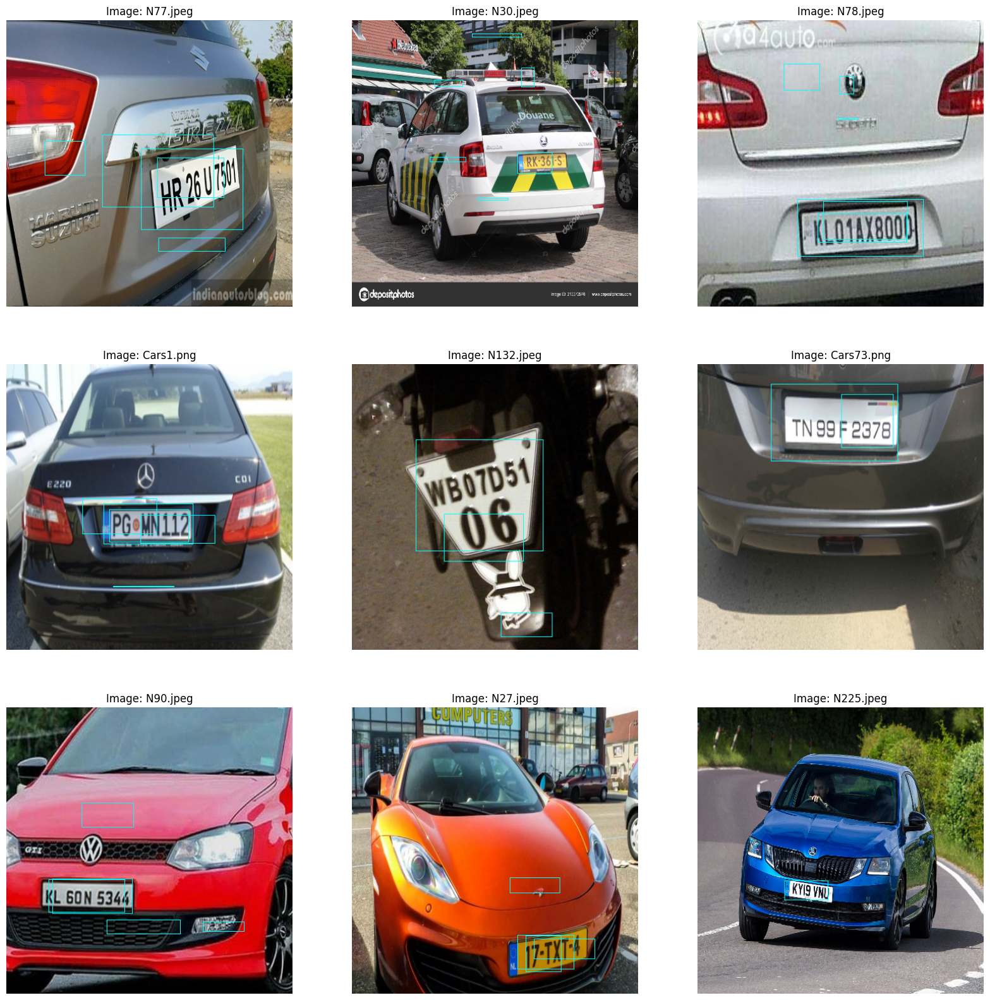

In [38]:
img_cnt = 9
# image_dir = './images'
# all_image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.endswith("jpeg")]
all_image_paths = []
test_file = open(test_txt_path, 'r')
for line in test_file:
    line = line.strip()
    all_image_paths.append(f"./data/all/{line.split(' ')[0]}")
selected_images = random.sample(all_image_paths, img_cnt)

fig, axes = plt.subplots(3, 3, figsize=(20,20))
axes = axes.flatten()
for ax, img_path in zip(axes, selected_images):
    np_img = cv2.imread(img_path)
    resized_img = cv2.resize(np_img, (IMAGE_SIZE, IMAGE_SIZE))
    resized_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB)
    np_img = resized_img
    np_img = np_img.astype(np.float32)
    np_img = np.reshape(np_img, (1, IMAGE_SIZE, IMAGE_SIZE, 3))

    y_pred = YOLO(np_img, training=False)
    for idx, (xmin, ymin, xmax, ymax, class_num, conf) in enumerate(process_outputs(y_pred)):
        if idx == 0 or conf >= 0.01:
            xmin, ymin, xmax, ymax = map(int, [xmin, ymin, xmax, ymax])
            class_name = classes_name[class_num]
            cv2.rectangle(resized_img, (xmin, ymin), (xmax, ymax), (0, 255, 255), 1)
            # cv2.putText(resized_img, class_name, (xmin, ymin), 2, 1, (0, 255, 255), 1)

    ax.imshow(resized_img)
    ax.set_title(f"Image: {os.path.basename(img_path)}")
    ax.axis('off')
plt.show()

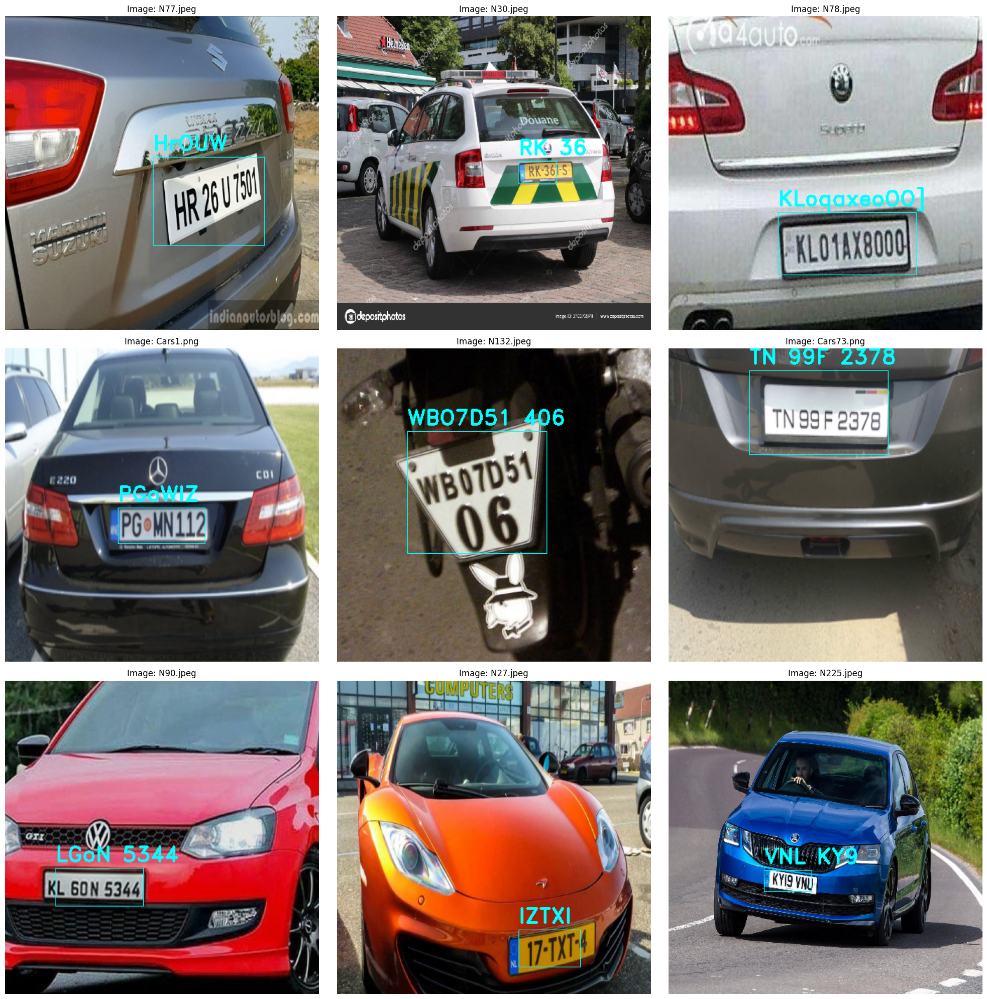

In [39]:
fig, axes = plt.subplots(3, 3, figsize=(20,20))
axes = axes.flatten()
for ax, img_path in zip(axes, selected_images):
    np_img = cv2.imread(img_path)
    resized_img = cv2.resize(np_img, (IMAGE_SIZE, IMAGE_SIZE))
    resized_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB)
    np_img = resized_img
    np_img = np_img.astype(np.float32)
    np_img = np.reshape(np_img, (1, IMAGE_SIZE, IMAGE_SIZE, 3))

    y_pred = YOLO(np_img, training=False)

    boxes, scores, class_nums = non_max_suppression(process_outputs(y_pred), score_threshold=0.01)
    for box, conf, class_num in zip(boxes, scores, class_nums):
        xmin, ymin, xmax, ymax = map(int, box)

        roi = resized_img[ymin:ymax, xmin:xmax]
        results = reader.readtext(roi, detail=0)
        text = ' '.join(results)
        if text:
            cv2.putText(resized_img, text, (xmin, ymin-10), 2, 1, (0, 255, 255), 2)
        else:
            cv2.putText(resized_img, "ERROR", (xmin, ymin-10), 2, 1, (255, 0, 0), 2)

        class_name = classes_name[class_num]
        cv2.rectangle(resized_img, (xmin, ymin), (xmax, ymax), (0, 255, 255), 1)
        # cv2.putText(resized_img, class_name, (xmin, ymin), 2, 1, (0, 255, 255), 1)

    ax.imshow(resized_img)
    ax.set_title(f"Image: {os.path.basename(img_path)}")
    ax.axis('off')
plt.tight_layout()
plt.show()

## Summary

#### Model
- 使用 `EfficientNetB7` 做 feature extraction
- 接 `YOLO` 的 detection head （多加數層 conv. layer，並加上 `BatchNormalization` 與 `Dropout`）

#### Training
- 每五個 epoch 會重新 augment 訓練資料(觀察到 re-augment 的那個 epoch 可以把 loss 稍微拉高，但持續保持 score，避免過早 overfit)
    - RandomHorizontalFlip(0.5)
    - RandomHSV(100, 100, 100)
    - RandomTranslate(0.1, diff=True)
    - RandomScale(0.4)
    - RandomShear(0.15)
- 使用 `ExponentialDecay` 逐步降低 learning rate(initial learning rate 設定為 1e-4)
- 先 freeze `EfficientNet` 訓練，再 unfreeze `EfficientNet` from `block7`，進行 fine-tune（learning rate 固定 1e-6）

#### Output optimization
- 使用 Non-Maximum Suppression (NMS) 消除多餘的 bbox，找到最佳的框